In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2 
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from tensorflow.keras.preprocessing import image

In [3]:
img = image.load_img("/kaggle/input/basedatas/testing/dogs/PDW-Castle-32-crop-3000x0-c-default.jpg")

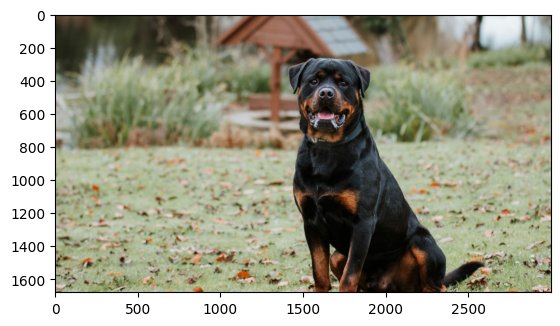

In [4]:
plt.imshow(img)

In [5]:
cv2.imread("/kaggle/input/basedatas/testing/dogs/PDW-Castle-32-crop-3000x0-c-default.jpg").shape

(1680, 3000, 3)

In [6]:
train = ImageDataGenerator(rescale = 1/255)
validation = ImageDataGenerator(rescale = 1/255)

In [7]:
train_dataset = train.flow_from_directory('/kaggle/input/basedatas/training/',
                                          target_size =(200,200),
                                         batch_size = 3,
                                         class_mode='binary')
validation_dataset = validation.flow_from_directory('/kaggle/input/basedatas/validation/',
                                          target_size =(200,200),
                                         batch_size = 3,
                                         class_mode='binary')

Found 46 images belonging to 2 classes.
Found 46 images belonging to 2 classes.


In [8]:
train_dataset.class_indices

{'cats': 0, 'dogs': 1}

In [9]:
train_dataset.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1], dtype=int32)

In [10]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(16,(3,3),activation='relu',input_shape=(200,200,3)),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Conv2D(32,(3,3),activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3),activation='relu'),
    tf.keras.layers.MaxPool2D(2,2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512,activation='relu'),
    tf.keras.layers.Dense(1,activation='sigmoid')
])

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [11]:
from tensorflow.keras.optimizers import RMSprop
model.compile(loss='binary_crossentropy',
             optimizer=RMSprop(),
             metrics = ['accuracy'])

In [12]:
model_fit=model.fit(train_dataset,
                   epochs=30,
                   validation_data=validation_dataset)

Epoch 1/30


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


16/16 ━━━━━━━━━━━━━━━━━━━━ 8s 386ms/step - accuracy: 0.6143 - loss: 3.0952 - val_accuracy: 0.5217 - val_loss: 0.6518
Epoch 2/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 326ms/step - accuracy: 0.6711 - loss: 0.6798 - val_accuracy: 0.5652 - val_loss: 0.5718
Epoch 3/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 329ms/step - accuracy: 0.5962 - loss: 0.6438 - val_accuracy: 0.9348 - val_loss: 0.4549
Epoch 4/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 328ms/step - accuracy: 0.8279 - loss: 0.5002 - val_accuracy: 0.8478 - val_loss: 0.3854
Epoch 5/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 326ms/step - accuracy: 0.7944 - loss: 0.4035 - val_accuracy: 0.8043 - val_loss: 0.3953
Epoch 6/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 350ms/step - accuracy: 0.9506 - loss: 0.3314 - val_accuracy: 0.9783 - val_loss: 0.1225
Epoch 7/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 333ms/step - accuracy: 0.9713 - loss: 0.1224 - val_accuracy: 1.0000 - val_loss: 0.0248
Epoch 8/30
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 330ms/step - accuracy: 0.9961 - loss: 0.0299 - val_accuracy: 0.8261 - val_

In [19]:
dir_path = '/kaggle/input/basedatas/testing'

for i in os.listdir(dir_path):
    file_path = os.path.join(dir_path, i)
    if os.path.isfile(file_path):  # Check if it is a file and not a directory
        img = image.load_img(file_path)
        plt.imshow(img)
        plt.show()
    else:
        print(f'Skipping directory: {file_path}')

Skipping directory: /kaggle/input/basedatas/testing/dogs
Skipping directory: /kaggle/input/basedatas/testing/cats


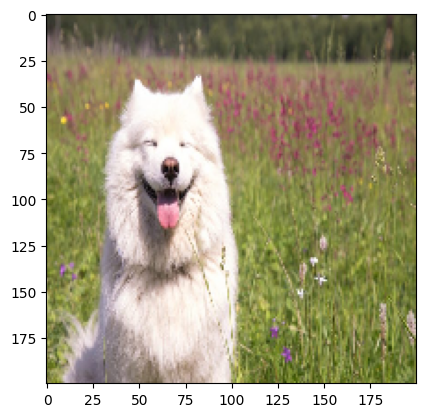

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
its an dog


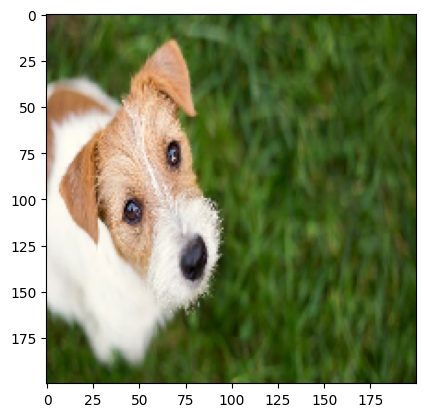

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
its an dog


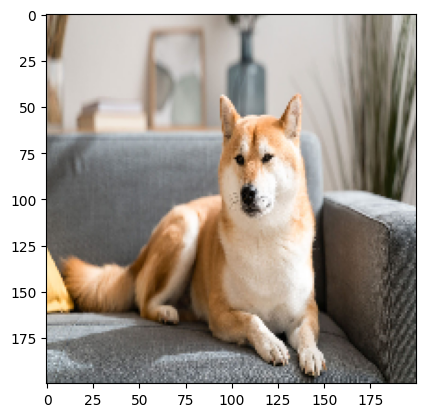

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
its an dog


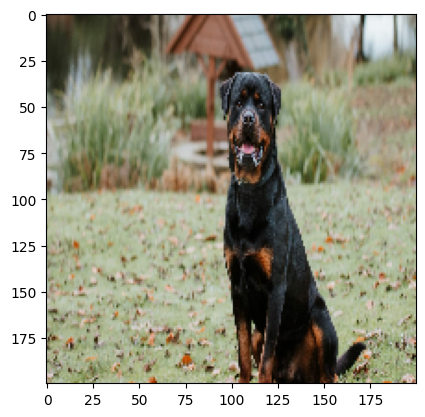

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
its an dog


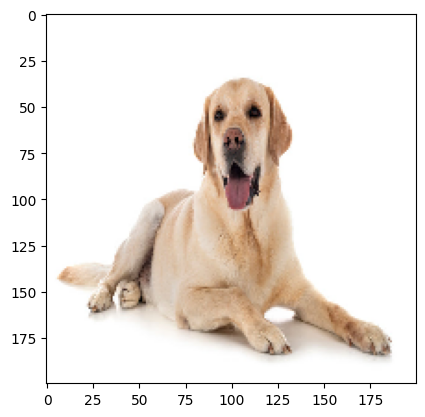

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
its an dog


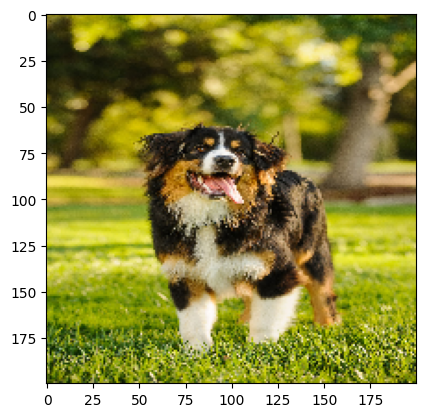

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
its an dog


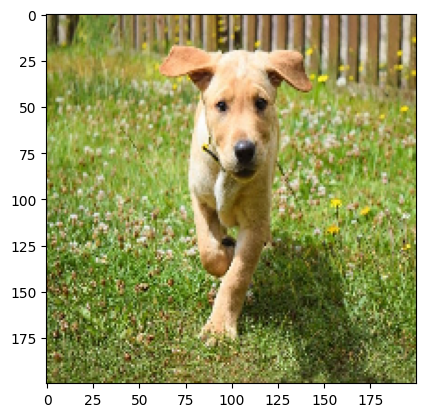

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
its an dog


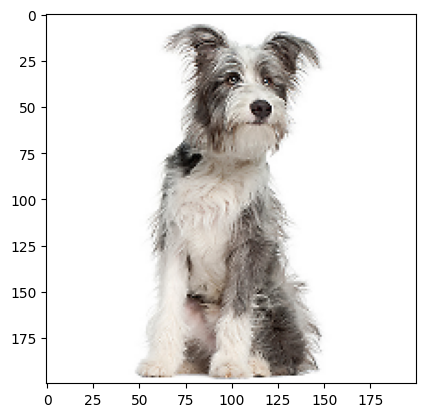

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
its an dog


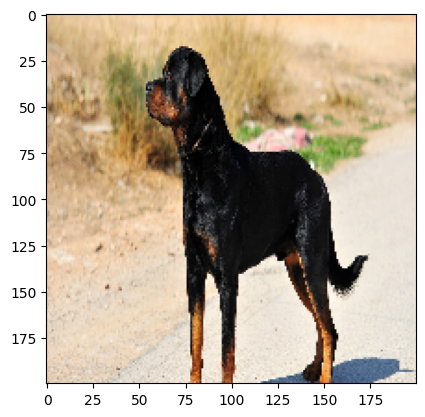

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
its an dog


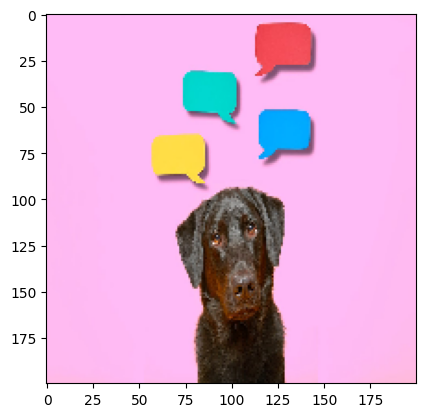

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
its an dog


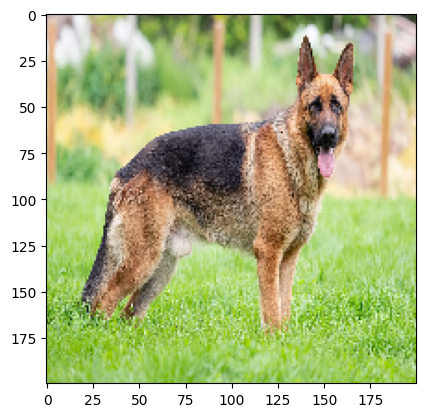

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
its an dog


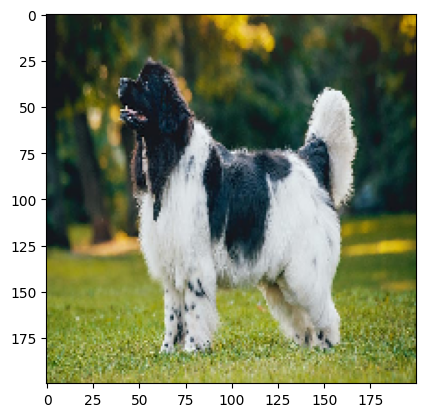

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
its an dog


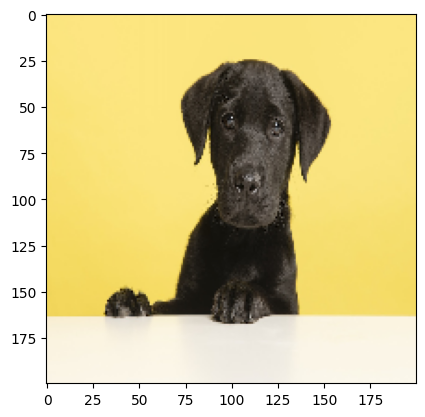

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
its an dog


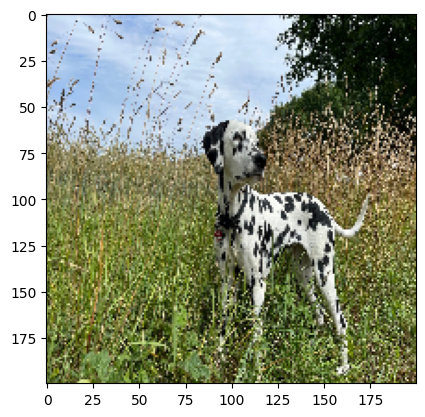

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
its an dog


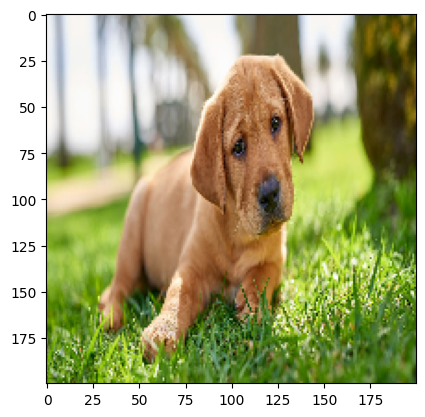

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
its an dog


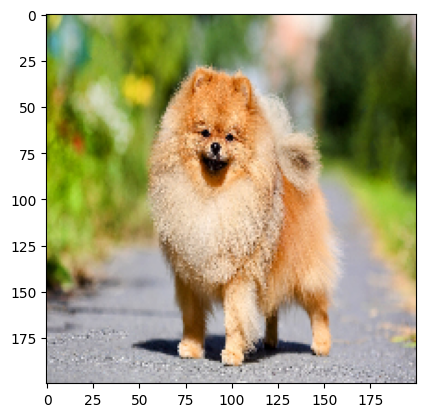

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
its an dog


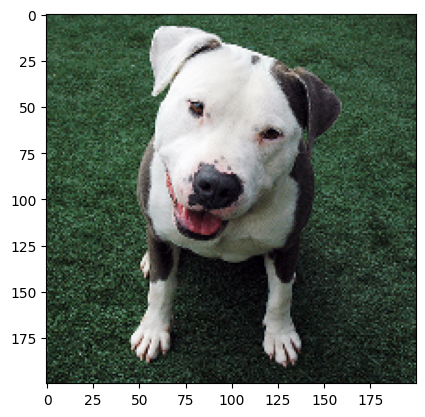

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
its an dog


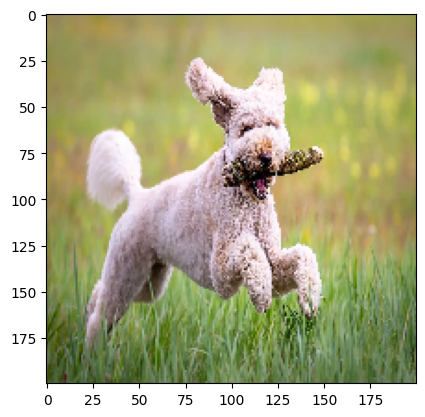

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
its an dog


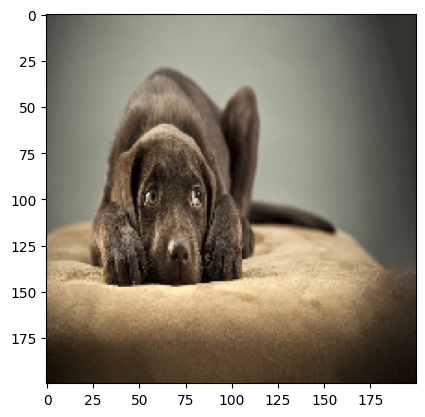

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
its an dog


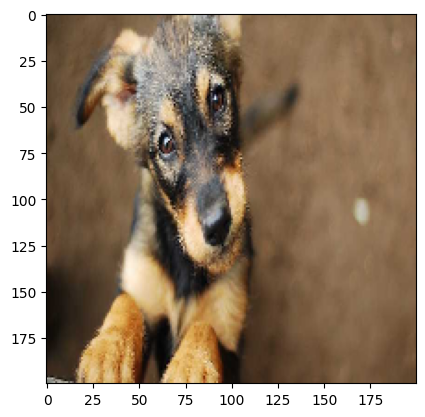

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
its an dog


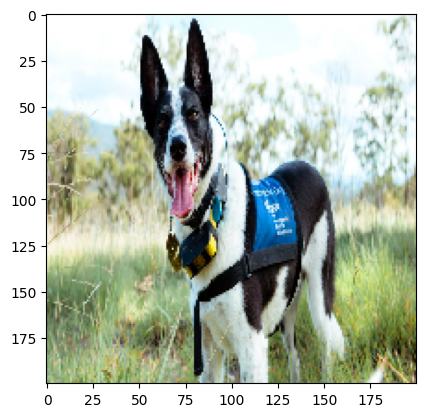

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
its an dog


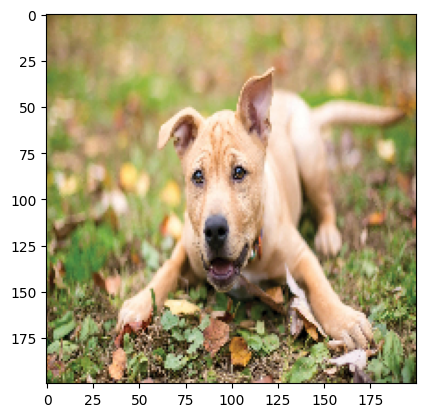

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
its an dog


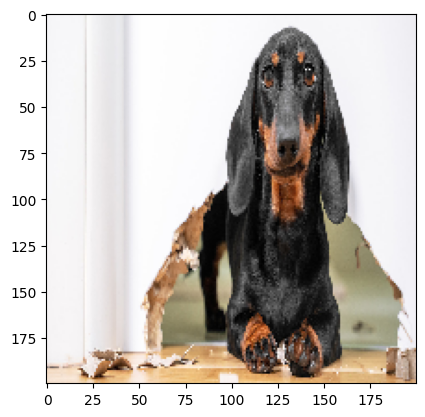

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
its an dog


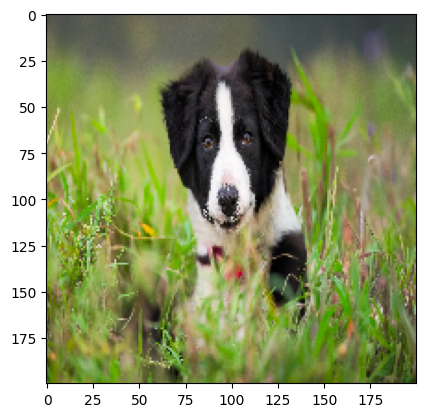

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
its an dog


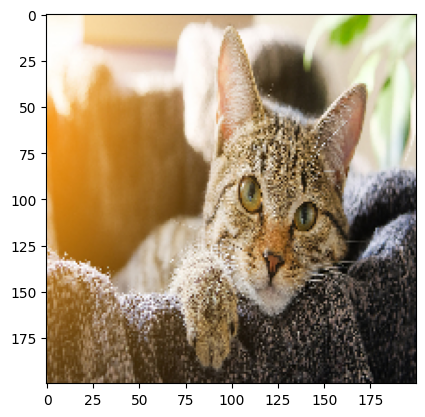

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
its an cat


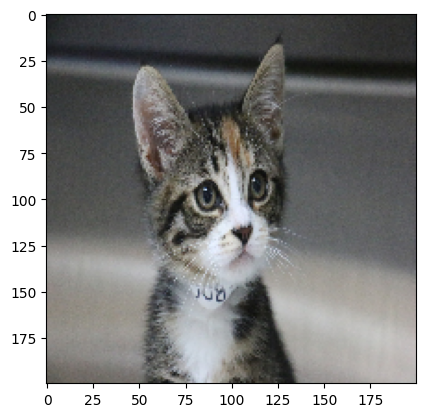

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
its an cat


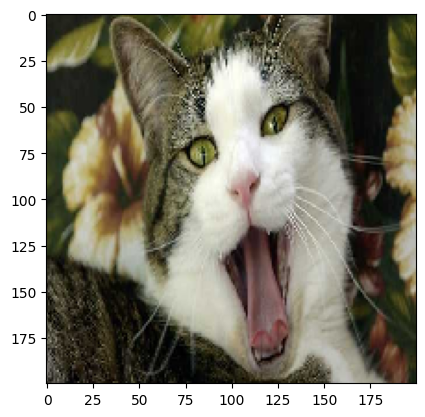

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
its an cat


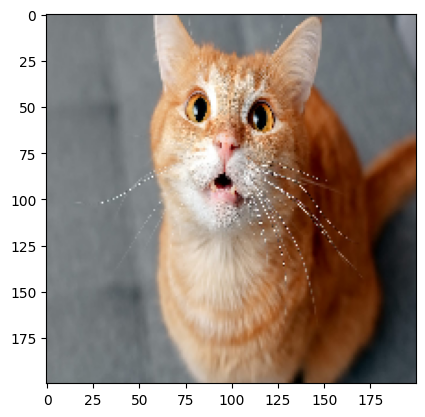

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
its an cat


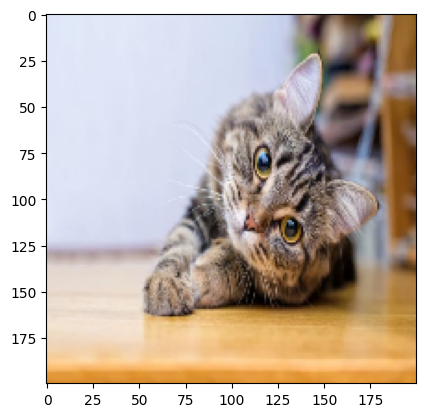

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
its an cat


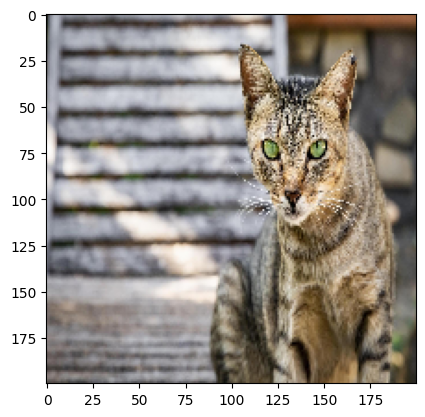

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
its an cat


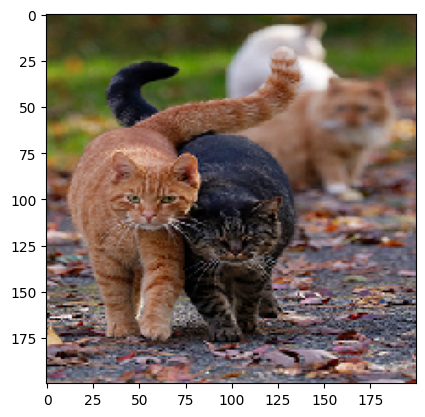

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
its an cat


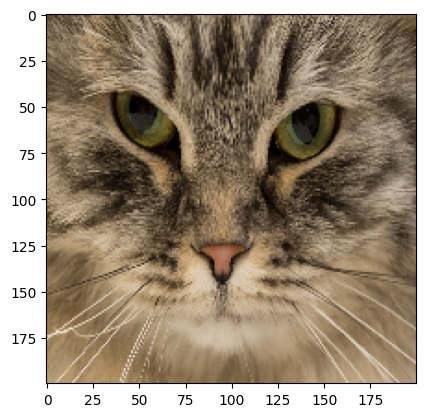

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
its an cat


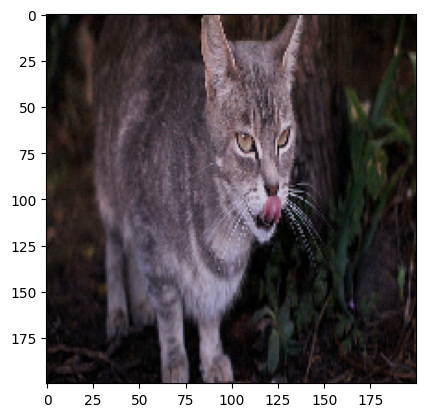

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
its an cat


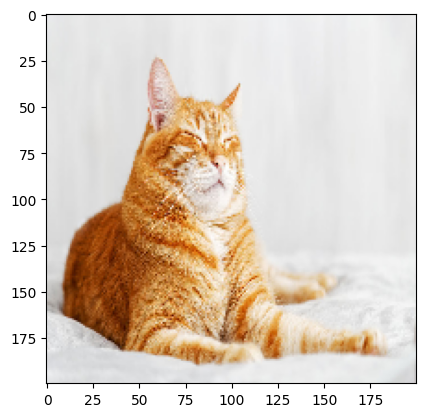

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
its an cat


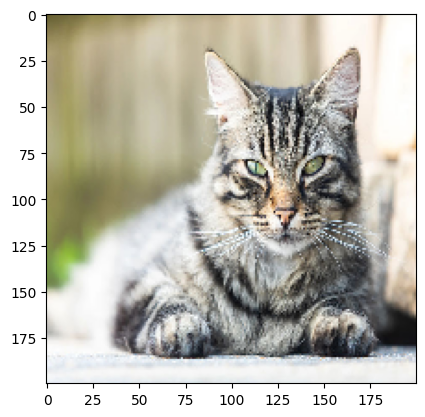

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
its an cat


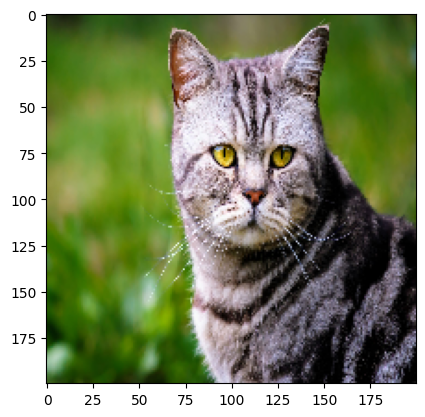

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
its an cat


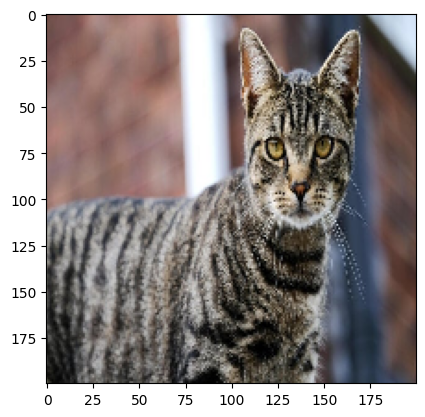

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
its an cat


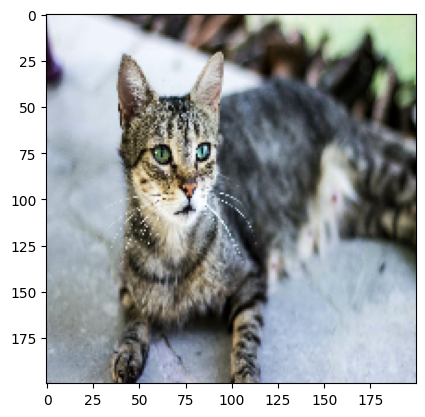

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
its an cat


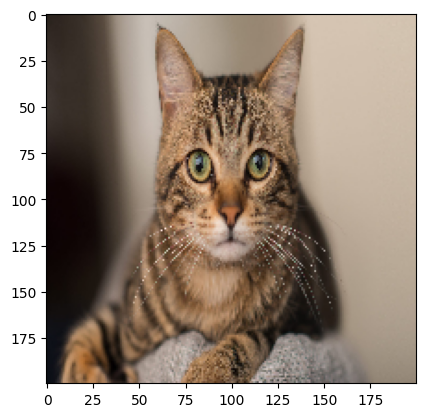

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
its an cat


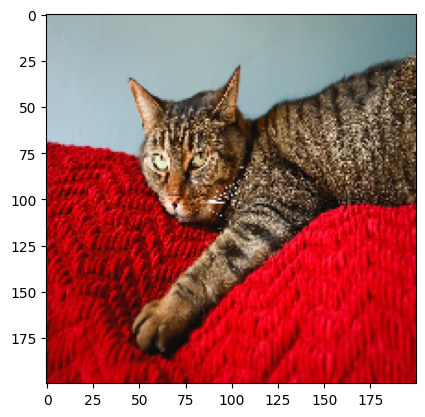

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
its an cat


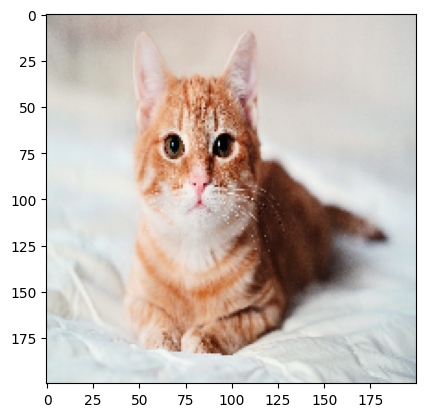

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
its an cat


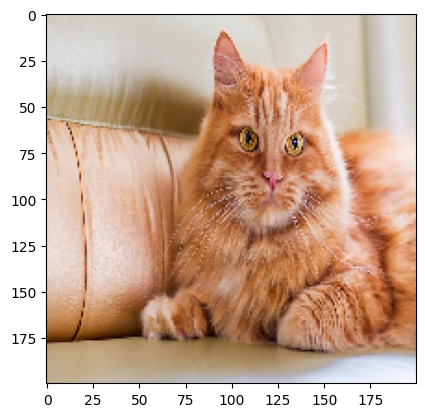

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
its an cat


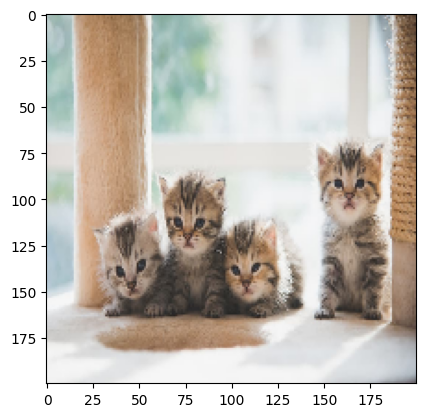

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
its an cat


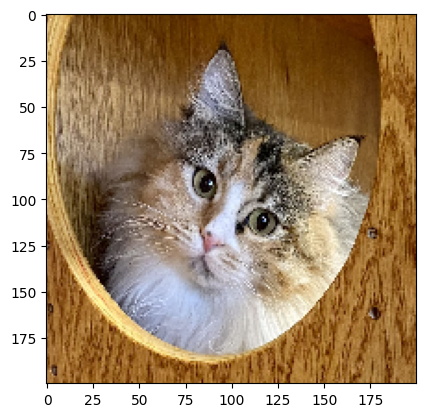

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
its an cat


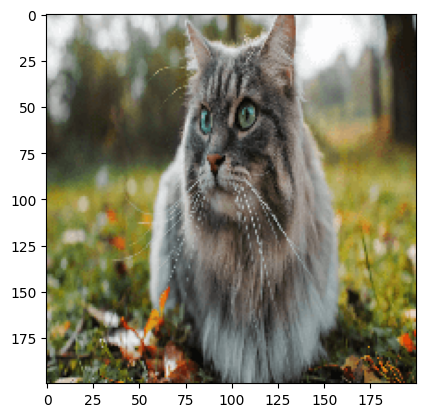

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
its an cat


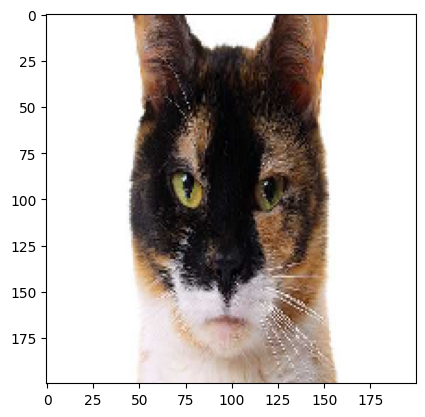

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
its an cat


In [21]:
def load_and_display_images_from_directory(directory):
    for root, dirs, files in os.walk(directory):
        for file in files:
            file_path = os.path.join(root, file)
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):  # Check if the file is an image
                try:
                    img = image.load_img(file_path,target_size=(200,200,3))
                    plt.imshow(img)
                    plt.show()
                    x = image.img_to_array(img)
                    x = np.expand_dims(x,axis = 0)
                    images = np.hstack([x])
                    val = model.predict(images)
                    if val == 0:
                        print("its an cat")
                    elif val == 1:
                        print('its an dog')
                    else:
                        print('Unknown')
                except Exception as e:
                    print(f"Could not load image {file_path}: {e}")

# Example usage
load_and_display_images_from_directory('/kaggle/input/basedatas/testing')